In [85]:
#loads dataset
from sklearn.datasets import fetch_openml

mnist = fetch_openml('mnist_784')


In [86]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split


print(mnist.DESCR)
print(mnist.keys())



**Author**: Yann LeCun, Corinna Cortes, Christopher J.C. Burges  
**Source**: [MNIST Website](http://yann.lecun.com/exdb/mnist/) - Date unknown  
**Please cite**:  

The MNIST database of handwritten digits with 784 features, raw data available at: http://yann.lecun.com/exdb/mnist/. It can be split in a training set of the first 60,000 examples, and a test set of 10,000 examples  

It is a subset of a larger set available from NIST. The digits have been size-normalized and centered in a fixed-size image. It is a good database for people who want to try learning techniques and pattern recognition methods on real-world data while spending minimal efforts on preprocessing and formatting. The original black and white (bilevel) images from NIST were size normalized to fit in a 20x20 pixel box while preserving their aspect ratio. The resulting images contain grey levels as a result of the anti-aliasing technique used by the normalization algorithm. the images were centered in a 28x28 image b

In [87]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


#split the data for training and testing
X_train, X_test, y_train, y_test, = train_test_split(mnist.data, mnist.target, random_state=11)

print(X_train.shape)
print(X_test.shape)


#we scale the data using StandardScaler
scaler = StandardScaler()
#fit using train data
scaler.fit(X_train)

#transform train data and test data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)



(52500, 784)
(17500, 784)


<AxesSubplot:xlabel='Component1', ylabel='Component2'>

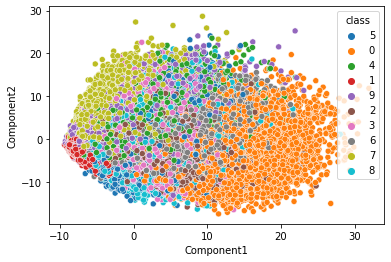

In [88]:
#===============visualizes the entire dataset after PCA (without splitting)==========================
mnist_df = pd.DataFrame(data=mnist.data,columns=mnist.feature_names)
mnist_df['class'] = [mnist.target[i] for i in range(0,len(mnist.target),1)]
scaler.fit(mnist.data)
scaled_data = scaler.transform(mnist.data)
pca = PCA(n_components=2, random_state=11)
pca.fit(scaled_data)
pca_data = pca.transform(scaled_data)

pca_full_df = pd.DataFrame(pca_data, columns=['Component1', 'Component2'])
pca_full_df['class'] = mnist_df['class']

#shows classification with PCA
sns.scatterplot(data=pca_full_df, x="Component1", y="Component2", hue="class",legend="brief")

In [89]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2, random_state=11)
pca.fit(X_train_scaled)

mnist_pca_train_X = pca.transform(X_train_scaled)
mnist_pca_test_X = pca.transform(X_test_scaled)


#shows sucessful scaling
print(f'Original Shape: {X_train_scaled.shape}')
print(f'Original Shape: {mnist_pca_train_X.shape}')

Original Shape: (52500, 784)
Original Shape: (52500, 2)


In [91]:
from sklearn.linear_model import LogisticRegression
import time

#Tests using the data before PCA is applied
logistic = LogisticRegression(solver = 'lbfgs', random_state=11, max_iter=1000,tol=0.01)

start = time.time()
logistic.fit(X=X_train_scaled,y=y_train)
end = time.time()

withoutPCATime = end-start
withoutPCAScore = logistic.score(X=X_test_scaled, y=y_test)
print(f"score:{withoutPCAScore:.2%} time:{withoutPCATime} seconds")


score:91.32% time:48.7306604385376 seconds


In [92]:
start = time.time()
logistic.fit(X=mnist_pca_train_X,y=y_train)
end = time.time()

withPCATime = end-start
withPCAScore = logistic.score(X=mnist_pca_test_X, y=y_test)
print(f"score:{withPCAScore:.2%} time:{withPCATime} seconds")

score:34.05% time:2.688807964324951 seconds


In [94]:
print(f"difference (in seconds): {withoutPCATime - withPCATime}")

difference (in seconds): 46.04185247421265


<p>As you can see, after PCA, the execution was about 46 seconds faster but with a lower accuracy</p>